In [1]:
from sklearn.cluster import KMeans, DBSCAN
from sklearn.preprocessing import StandardScaler, MinMaxScaler, PowerTransformer
from sklearn.metrics import silhouette_samples, silhouette_score
from sklearn.metrics import homogeneity_completeness_v_measure, homogeneity_score, completeness_score, v_measure_score
from scikitplot.metrics import plot_silhouette
from scikitplot.cluster import plot_elbow_curve
from sklearn.ensemble import RandomForestClassifier
from sklearn.linear_model import LogisticRegression, LogisticRegressionCV
from sklearn.model_selection import train_test_split, cross_val_score, KFold
from sklearn.metrics import classification_report
from sklearn.metrics import roc_auc_score, average_precision_score, plot_roc_curve, plot_precision_recall_curve

In [2]:
import warnings
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
sns.set(font_scale=1.5)
pd.options.display.max_rows = 4000
pd.options.display.max_columns = 4000

%config InlineBackend.figure_format = 'retina'
%matplotlib inline

warnings.simplefilter('ignore')

In [3]:
data = pd.read_csv('data-btc-hourly.csv')
#data.drop('Date.1',axis=1,inplace=True)
data.index = pd.DatetimeIndex(data['Date'])
data.drop('Date',axis=1,inplace=True)

In [4]:
data.shape

(44425, 61)

In [5]:
data['Return_4h'] = data['Close'].pct_change(4).shift(-5)
data['BuyorSell'] = [-1 if x <= 0 else 1 for x in data['Return_4h']]
data.dropna(axis=0,inplace=True)

In [6]:
#Including flat return to negative return class
data['BuyorSell'].fillna(0,inplace=True)

In [7]:
#Creates new moving averages
def EMAS_TA(df,col,ma1,ma2):
    if (type(ma1) or type(ma2)) != int:
        print('ma1 and ma2 are not integer')
    elif ma1 > ma2:
        print('ma1 needs to be smaller than ma2')
    else:
        a = col + '_' + str(ma1) + 'MA'
        b = col + '_' + str(ma2) + 'MA'
        df[a] = df[col].ewm(span=ma1,adjust=True).mean()
        df[b] = df[col].ewm(span=ma2,adjust=True).mean()
        c = 'diff' + str(a) + '_' + str(b) 
        df[c] = df[b] - df[a]
    return

In [8]:
#create exp moving average for 1 week vs 2 weeks
EMAS_TA(data,'Close',24,48)

In [9]:
#New features
data['Diff_Close_Open'] = data.Close - data.Open
data['Diff_Close_avg'] = data.Close - data.avg

In [10]:
data.dropna(axis=0,inplace=True)

In [11]:
#other features, position of Close price vs moving averages
data['Dist_Close_STmas'] = data.Close - data.Close_8MA
data['Dist_Close_LTmas'] = data.Close - data.Close_16MA

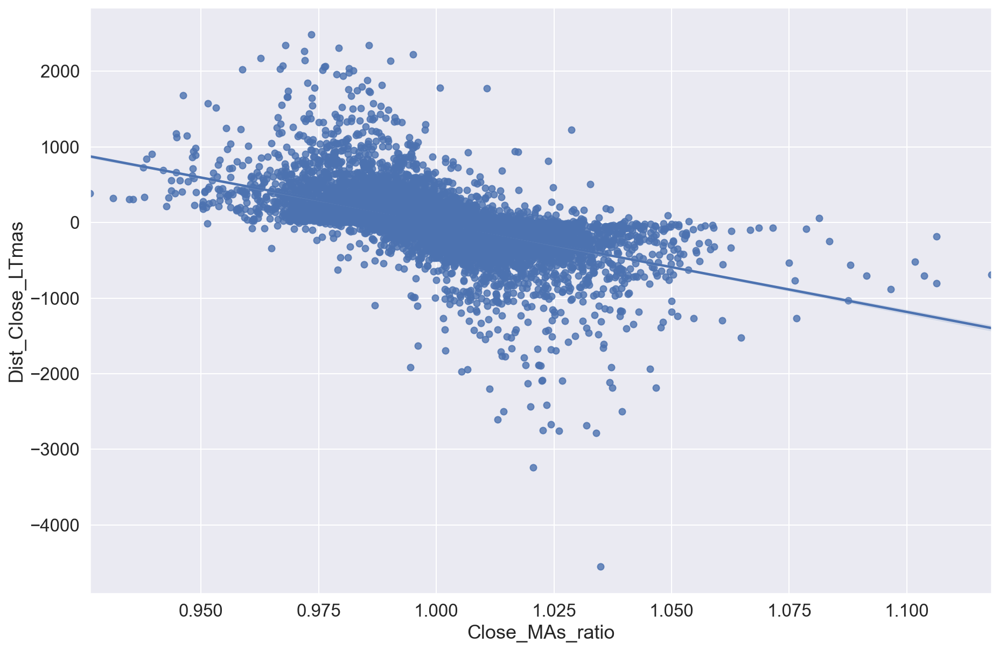

In [12]:
#Check relationship between chosen features
fig, ax = plt.subplots(figsize=(15,10))
sns.regplot(data=data,x='Close_MAs_ratio', y='Dist_Close_LTmas',ax=ax)
plt.show()

In [13]:
y = data['BuyorSell'].copy()

In [14]:
data.columns

Index(['Open', 'High', 'Low', 'Close', 'Volume', 'avg', 'rtn_Close',
       'abs_rtn_Close', 'Close_std8', 'Close_std16', 'abs_rtn_Close_8MA',
       'abs_rtn_Close_16MA', 'Close_8EMA', 'Close_16EMA', 'Close_8MA',
       'Close_16MA', 'Diff_Close_16EMAClose_8EMA', 'BolUpClose_8MA',
       'BolDnClose_8MA', 'BolUpClose_16MA', 'BolDnClose_16MA', 'rtn_Volume',
       'abs_rtn_Volume', 'Volume_std8', 'Volume_std16', 'abs_rtn_Volume_8MA',
       'abs_rtn_Volume_16MA', 'Volume_8EMA', 'Volume_16EMA', 'Volume_8MA',
       'Volume_16MA', 'Diff_Volume_16EMAVolume_8EMA', 'BolUpVolume_8MA',
       'BolDnVolume_8MA', 'BolUpVolume_16MA', 'BolDnVolume_16MA', 'rtn_avg',
       'abs_rtn_avg', 'avg_std8', 'avg_std16', 'abs_rtn_avg_8MA',
       'abs_rtn_avg_16MA', 'avg_8EMA', 'avg_16EMA', 'avg_8MA', 'avg_16MA',
       'Diff_avg_16EMAavg_8EMA', 'BolUpavg_8MA', 'BolDnavg_8MA',
       'BolUpavg_16MA', 'BolDnavg_16MA', 'RSI_Close', 'Volume_ratio',
       'Close_MAs_ratio', 'DnBol_Dist_16', 'UpBol_Dist_16', '

In [ ]:
'Diff_Close_16EMAClose_8EMA','RSI_Close',
       'Close_MAs_ratio', 'DnBol_Dist_16', 'UpBol_Dist_16',
       'ATR',
       'diffClose_24MA_Close_48MA'

In [ ]:
'Diff_Close_16EMAClose_8EMA','Diff_Volume_16EMAVolume_8EMA',
    'RSI_Close','Volume_ratio','DnBol_Dist_16','Close_MAs_ratio',
'UpBol_Dist_16','Dist_BolDn_BolUp','Dist_Close_STmas','Dist_Close_LTmas'

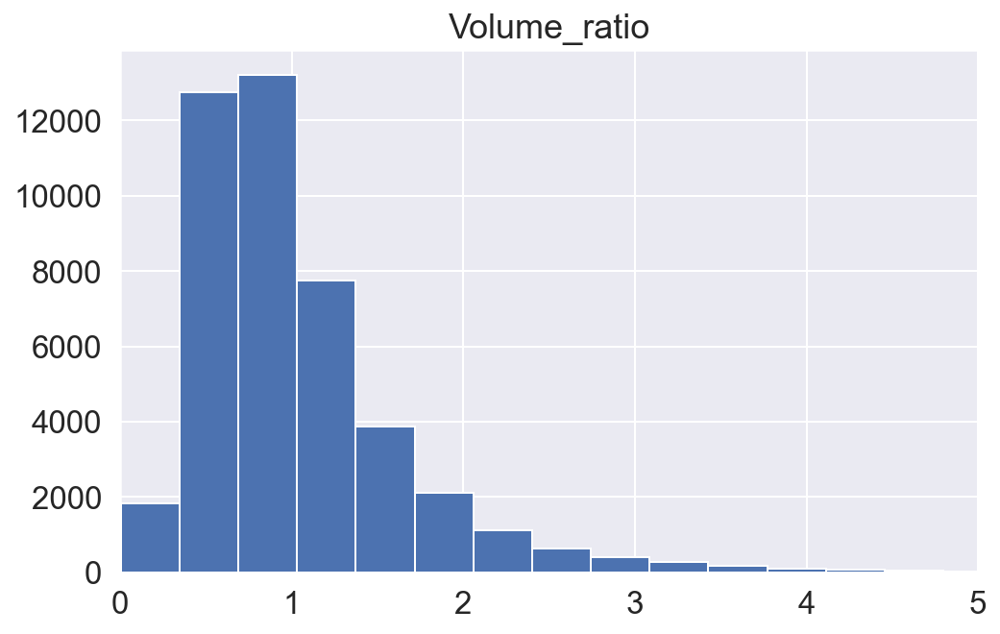

In [48]:
plt.figure(figsize=(8,5))
data['Volume_ratio'].hist(bins=20)
plt.title('Volume_ratio')
plt.xlim(0,5)
plt.show()

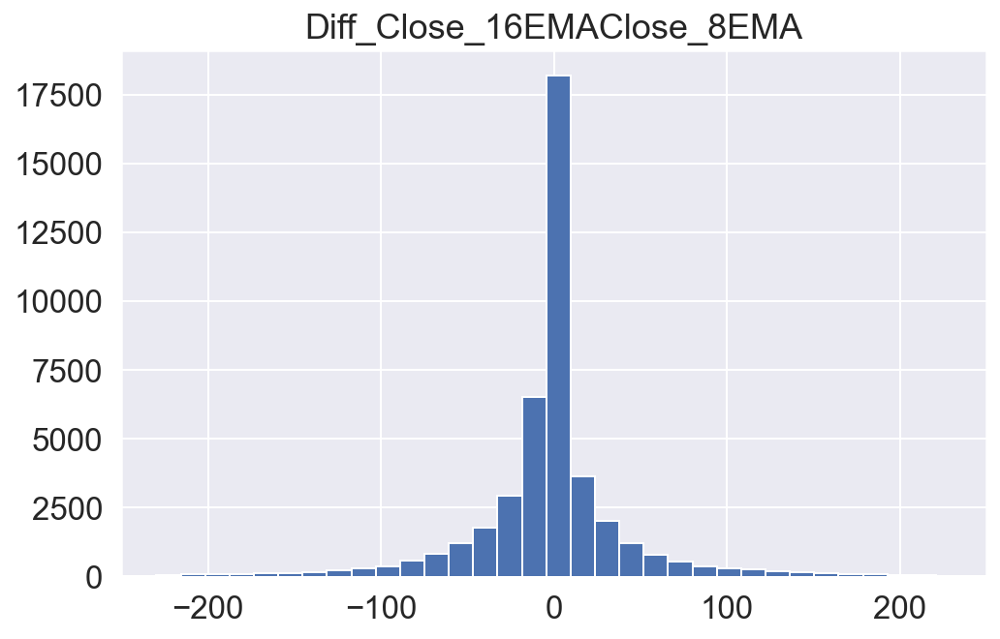

In [50]:
plt.figure(figsize=(8,5))
data['Diff_Close_16EMAClose_8EMA'].hist(bins=150)
plt.title('Diff_Close_16EMAClose_8EMA')
plt.xlim(-250,250)
plt.show()

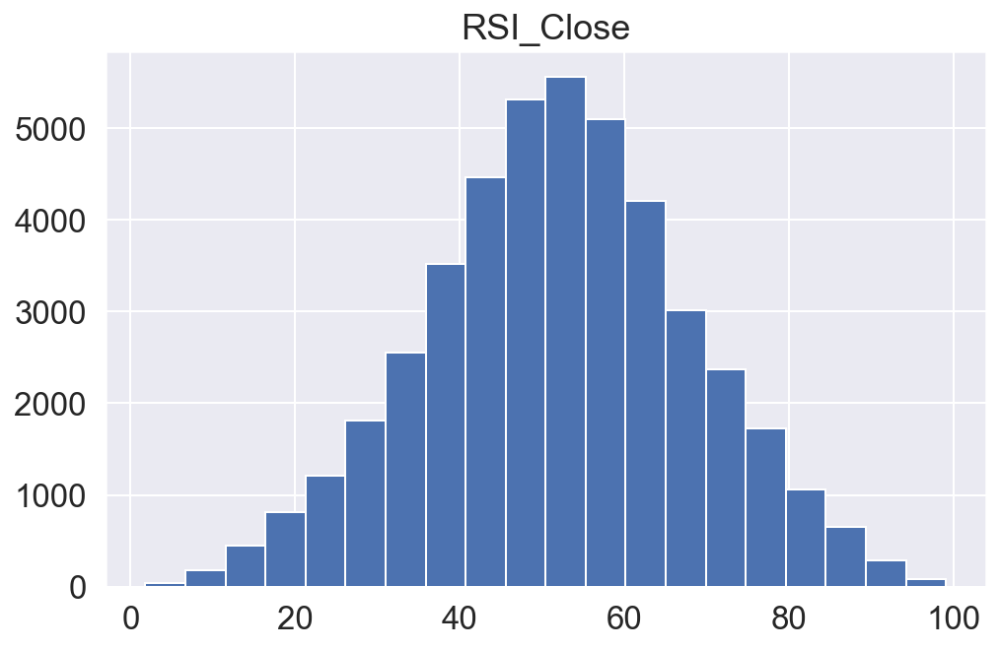

In [51]:
plt.figure(figsize=(8,5))
data['RSI_Close'].hist(bins=20)
plt.title('RSI_Close')
#plt.xlim(0,5)
plt.show()

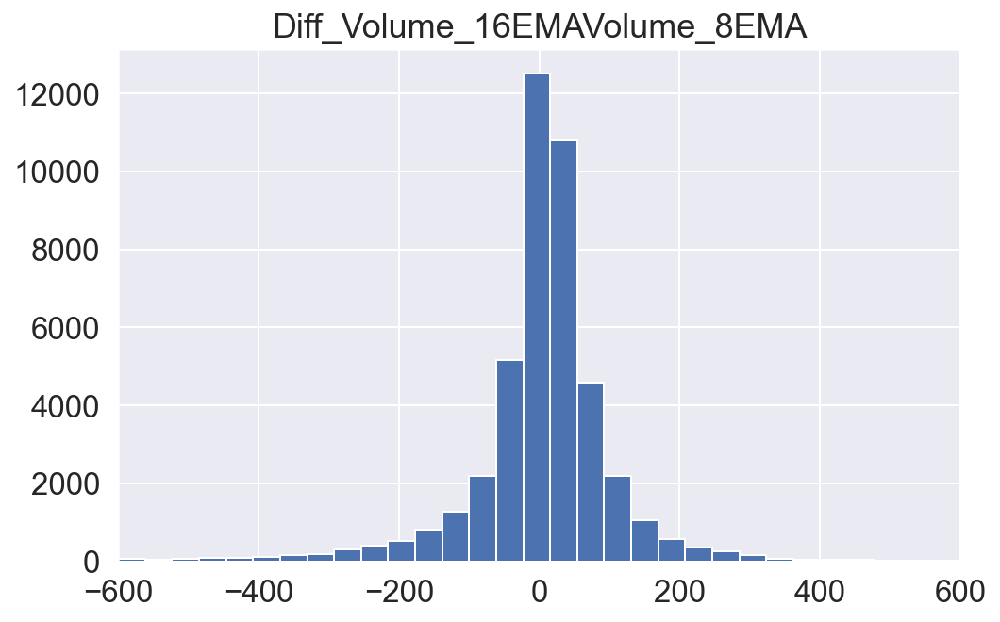

In [52]:
plt.figure(figsize=(8,5))
data['Diff_Volume_16EMAVolume_8EMA'].hist(bins=100)
plt.title('Diff_Volume_16EMAVolume_8EMA')
plt.xlim(-600,600)
plt.show()

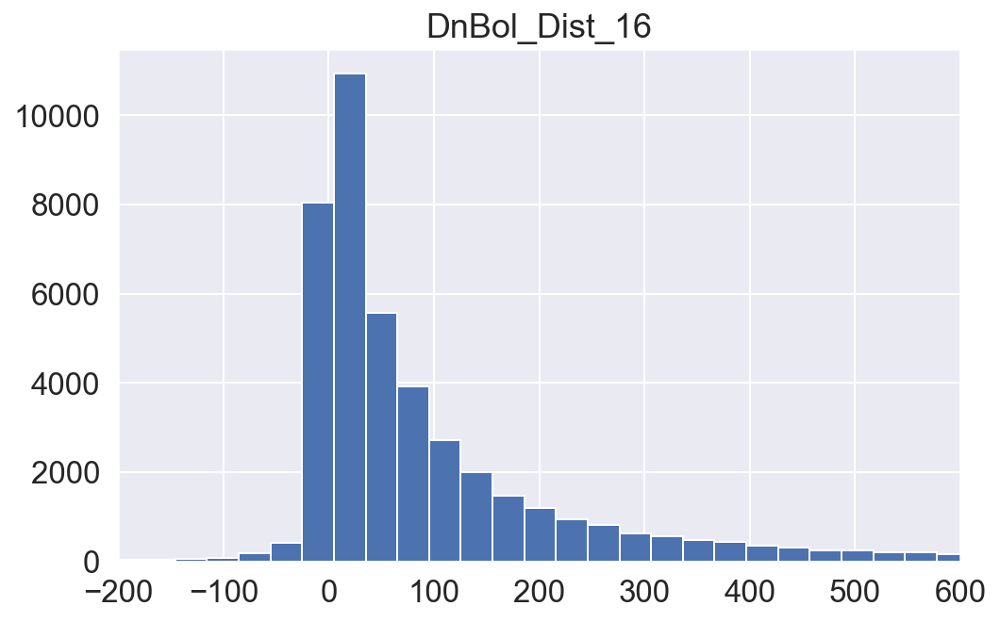

In [53]:
plt.figure(figsize=(8,5))
data['DnBol_Dist_16'].hist(bins=200)
plt.title('DnBol_Dist_16')
plt.xlim(-200,600)
plt.show()

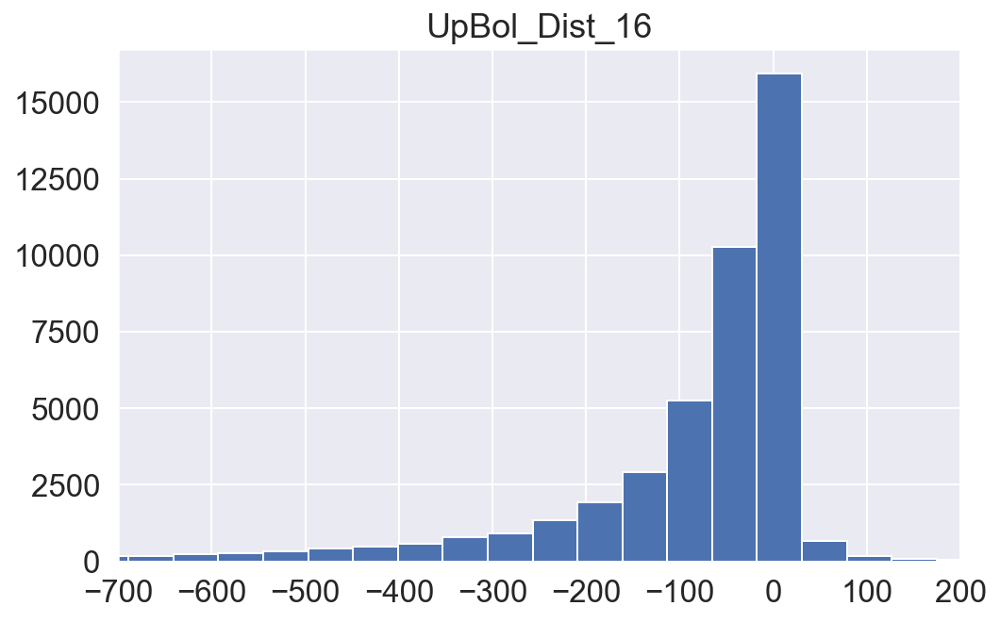

In [54]:
plt.figure(figsize=(8,5))
data['UpBol_Dist_16'].hist(bins=200)
plt.title('UpBol_Dist_16')
plt.xlim(-700,200)
plt.show()

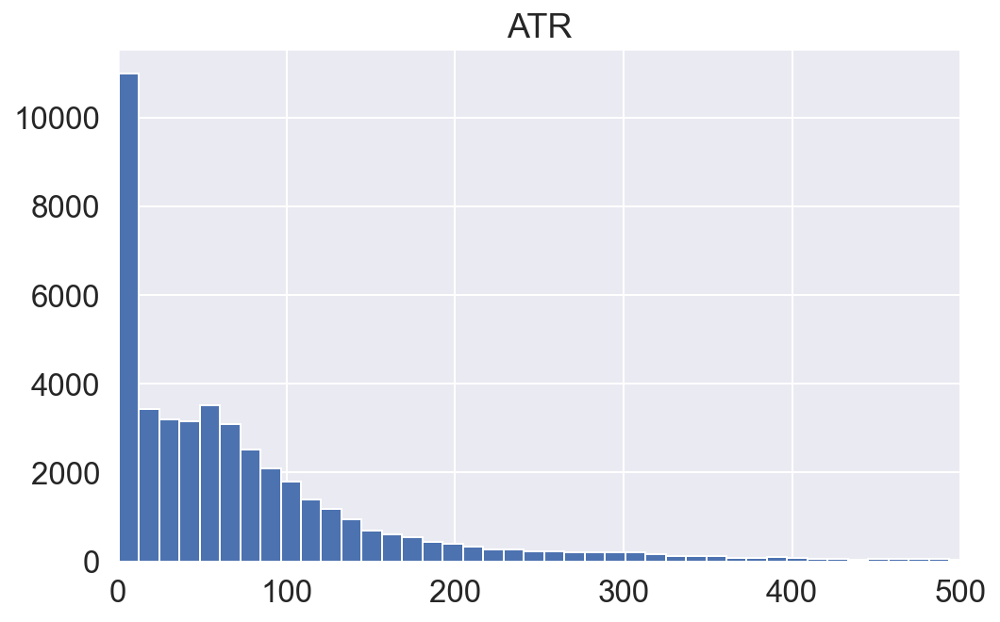

In [55]:
plt.figure(figsize=(8,5))
data['ATR'].hist(bins=200)
plt.title('ATR')
plt.xlim(0,500)
plt.show()

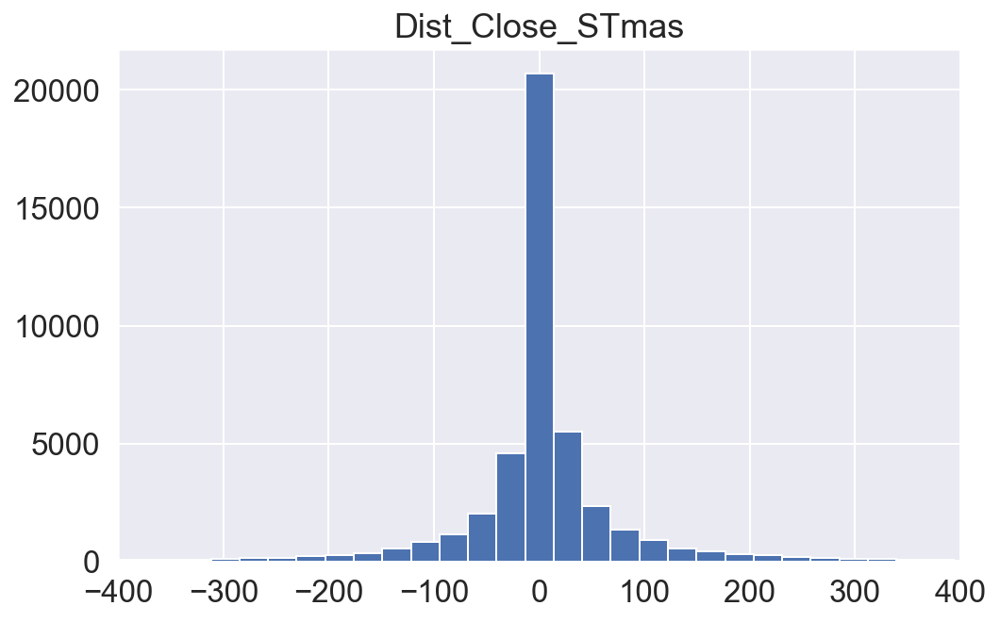

In [59]:
plt.figure(figsize=(8,5))
data['Dist_Close_STmas'].hist(bins=200)
plt.title('Dist_Close_STmas')
plt.xlim(-400,400)
plt.show()

<function matplotlib.pyplot.show(close=None, block=None)>

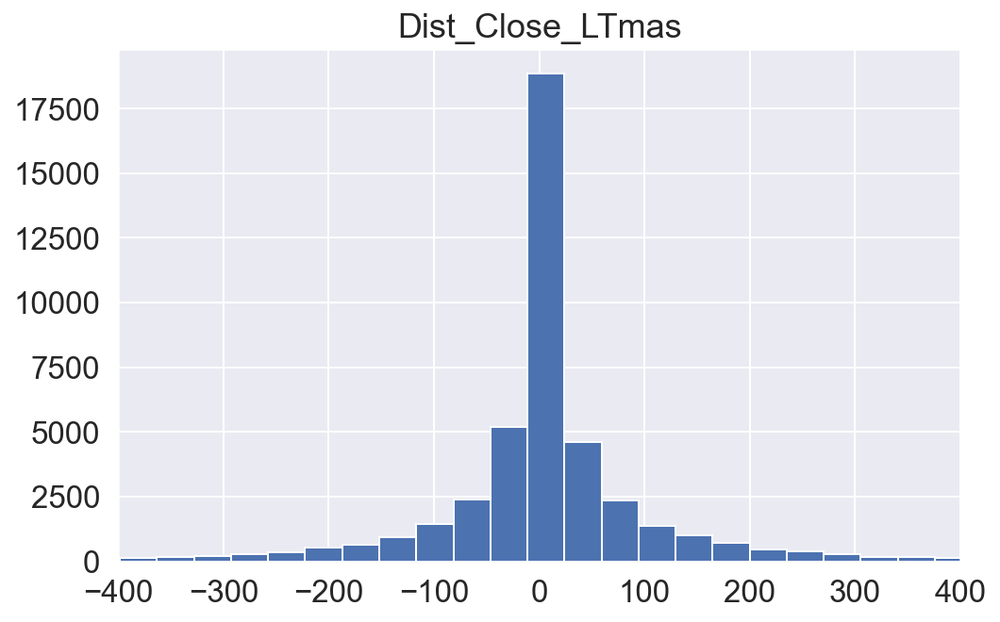

In [60]:
plt.figure(figsize=(8,5))
data['Dist_Close_LTmas'].hist(bins=200)
plt.title('Dist_Close_LTmas')
plt.xlim(-400,400)
plt.show

<function matplotlib.pyplot.show(close=None, block=None)>

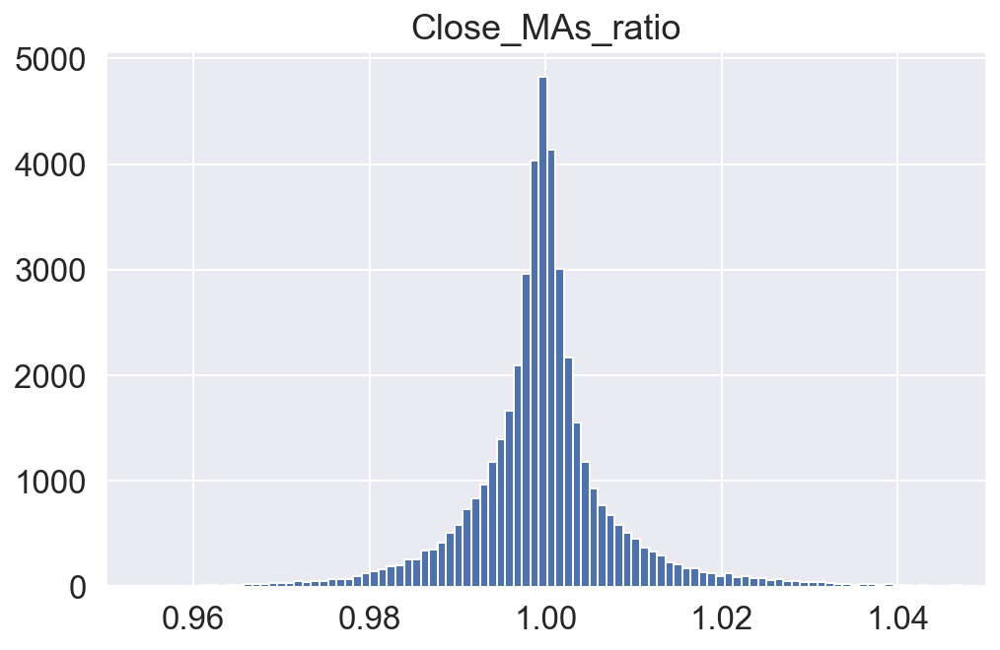

In [66]:
plt.figure(figsize=(8,5))
data['Close_MAs_ratio'].hist(bins=200)
plt.title('Close_MAs_ratio')
plt.xlim(0.95,1.05)
plt.show

<function matplotlib.pyplot.show(close=None, block=None)>

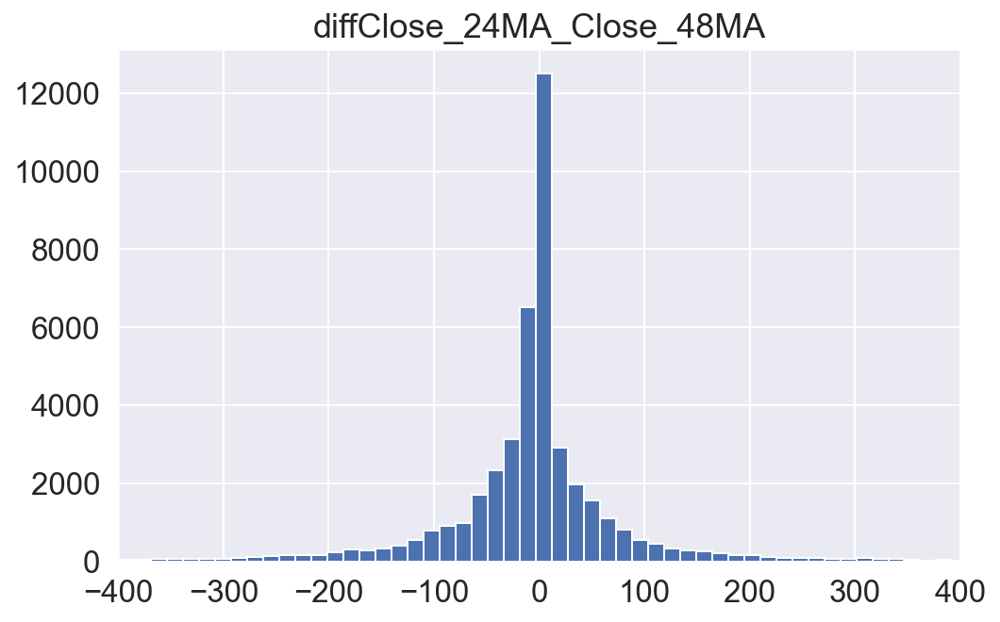

In [65]:
plt.figure(figsize=(8,5))
data['diffClose_24MA_Close_48MA'].hist(bins=200)
plt.title('diffClose_24MA_Close_48MA')
plt.xlim(-400,400)
plt.show

In [138]:
'''X = data[['Volume','Diff_Close_24EMAClose_12EMA','rtn_Volume','Volume_std12',
'Volume_std24','Diff_Volume_24EMAVolume_12EMA','avg_std12','avg_std24',
'Diff_avg_24EMAavg_12EMA','RSI_Close','Volume_ratio','Close_MAs_ratio','DnBol_Dist_24',
'UpBol_Dist_24','Dist_BolDn_BolUp','ATR','Dist_Close_STmas','Dist_Close_LTmas',
'diffClose_168MA_Close_336MA','Diff_Close_Open']].copy()

SyntaxError: EOF while scanning triple-quoted string literal (<ipython-input-138-48d3445f2d3a>, line 5)

In [ ]:
'''X = data[['Volume','Diff_Close_16EMAClose_8EMA',
'Volume_std16','Diff_Volume_16EMAVolume_8EMA','RSI_Close','Volume_ratio','Close_MAs_ratio','DnBol_Dist_16',
'UpBol_Dist_16','Dist_BolDn_BolUp','ATR',
'diffClose_24MA_Close_48MA','Diff_Close_Open']].copy()

In [ ]:
X = data[['Diff_Close_16EMAClose_8EMA','RSI_Close',
       'Close_MAs_ratio', 'DnBol_Dist_16', 'UpBol_Dist_16',
       'ATR',
       'diffClose_24MA_Close_48MA']].copy()
#X['rtn_Close_prev'] = data.rtn_Close.shift(1).fillna(0)

In [ ]:
plt.figure(figsize=(15,10))
sns.heatmap(X.corr())#,annot=True)

In [139]:
#X = pd.get_dummies(X,columns=['pivot'],drop_first=True)

In [140]:
scaler1 = StandardScaler()
scaler2 = MinMaxScaler()
Xstd = scaler2.fit_transform(X)

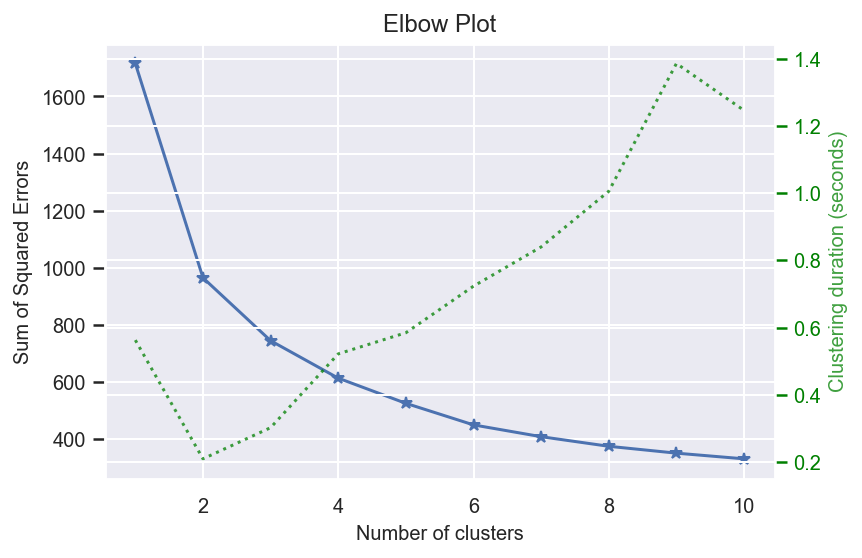

In [141]:
knn = KMeans(n_clusters=3, random_state=1)
plot_elbow_curve(knn, Xstd, cluster_ranges=range(1, 11))
plt.show()

In [347]:
from matplotlib.colors import ListedColormap
import matplotlib.cm as cm
from tqdm import tqdm

100%|████████████████████████████████████████████████████████████████████████████████████| 4/4 [03:46<00:00, 56.57s/it]


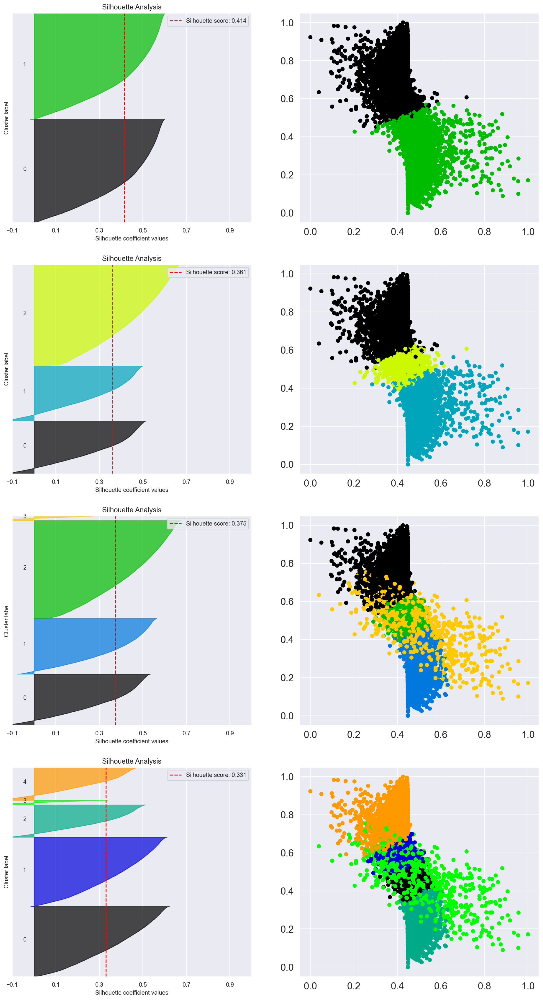

In [348]:
#Looking at clustering model to see if some patterns emerge. Ideally I am selecting features so the model can clustering 
# support and resistance

silhouette = []

fig, ax = plt.subplots(nrows=4, ncols=2, figsize=(16, 30))

for k in tqdm(range(2, 6)):

    model = KMeans(n_clusters=k, random_state=1)
    labels = model.fit_predict(Xstd)
    silhouette.append((k, silhouette_score(Xstd, labels)))

    colors = cm.nipy_spectral(labels.astype(float) / k)
    plot_silhouette(Xstd, labels, ax=ax[k-2, 0])
    ax[k-2, 1].scatter(Xstd[:, 0], Xstd[:, 1], color=colors)

silhouette = np.array(silhouette)

In [22]:
model = KMeans(n_clusters=2, random_state=1)
model.fit(Xstd)
labels = model.predict(Xstd)

In [23]:
df = pd.DataFrame(labels,columns=['Labels'])

In [24]:
df['Close'] = data.Close.values

In [25]:
df.set_index(data.index,inplace=True)

In [26]:
df.Labels.value_counts()

1    20881
0    20211
Name: Labels, dtype: int64

In [27]:
import plotly.graph_objects as go

layout = dict(title='ETH',
              plot_bgcolor='white',
              margin=dict(t=60, b=40, l=20, r=20),
              xaxis=dict(linecolor='gray', mirror=True, showgrid=False),
              yaxis=dict(linecolor='gray', mirror=True, showgrid=False),
                                 )

Chart = []

Chart.append(go.Scatter(x=data.index,
                       y=data['Close'],
                       name='avg',
                       mode='lines',
                       line=dict(color='lime', width=1)))

#Chart.append(go.Scatter(x=data.index,
 #                      y=data['Close_60MA'],
  #                     name='60MA',
   #                    mode='lines',
    #                   line=dict(color='grey', width=1)))

Chart.append(go.Scatter(x=df.query('Labels == 2').index,
                      y=df.query('Labels == 2')['Close'],
                     name='avg, Labels = 2',
                        mode='markers',
                       marker=dict(color='purple', size=5)))

Chart.append(go.Scatter(x=df.query('Labels == 1').index,
                       y=df.query('Labels == 1')['Close'],
                       name='avg, Labels = 1',
                       mode='markers',
                       marker=dict(color='orange', size=5)))

Chart.append(go.Scatter(x=df.query('Labels == 0').index,
                       y=df.query('Labels == 0')['Close'],
                       name='avg, Labels = 0',
                       mode='markers',
                       marker=dict(color='blue', size=5)))

#Chart.append(go.Scatter(x=df.query('Labels == 3').index,
 #                      y=df.query('Labels == 3')['Close'],
  #                     name='avg, Labels = 3',
   #                    mode='markers',
    #                   marker=dict(color='blue', size=5)))



fig = go.Figure(data=Chart, layout=layout)

fig.show()

In [368]:
from plotly.subplots import make_subplots
fig = make_subplots(rows=2, cols=1, shared_xaxes=True, 
               vertical_spacing=0.03, subplot_titles=('Price', 'Vol'), 
               row_width=[0.4, 0.97])

# Plot OHLC on 1st row
fig.add_trace(go.Scatter(x=data.index,
                       y=data['Close'],
                       name='avg',
                       mode='lines',
                       line=dict(color='lime', width=1)))

#Chart.append(go.Scatter(x=data.index,
 #                      y=data['Close_60MA'],
  #                     name='60MA',
   #                    mode='lines',
    #                   line=dict(color='grey', width=1)))

fig.add_trace(go.Scatter(x=df.query('Labels == 2').index,
                       y=df.query('Labels == 2')['Close'],
                     name='Labels = 2',
                       mode='markers',
                       marker=dict(color='purple', size=5)))

fig.add_trace(go.Scatter(x=df.query('Labels == 1').index,
                       y=df.query('Labels == 1')['Close'],
                       name='Labels = 1',
                       mode='markers',
                       marker=dict(color='orange', size=5)))

fig.add_trace(go.Scatter(x=df.query('Labels == 0').index,
                       y=df.query('Labels == 0')['Close'],
                       name='Labels = 0',
                       mode='markers',
                       marker=dict(color='blue', size=5)))

fig.add_trace(go.Scatter(x=df.query('Labels == 3').index,
                       y=df.query('Labels == 3')['Close'],
                       name='Labels = 3',
                       mode='markers',
                       marker=dict(color='blue', size=5)))


# Bar trace for volumes on 2nd row without legend
fig.add_trace(go.Scatter(x=data.index, y=data[''], showlegend=False), row=2, col=1)

# Do not show OHLC's rangeslider plot 
fig.update_layout(height=1000, width=1000)
fig.update(layout_xaxis_rangeslider_visible=False)
fig.show()

KeyError: ''

dbscan = DBSCAN(eps=0.5, min_samples=7)
dbscan.fit(Xstd)

In [ ]:
print("Labels:")
labels_db = dbscan.labels_
print(labels)

In [ ]:
print(dbscan.core_sample_indices_)

In [ ]:
core_samples = np.zeros_like(labels_db, dtype=bool)

In [ ]:
core_samples

In [ ]:
core_samples[dbscan.core_sample_indices_] = True
core_samples

In [ ]:
print("Core samples")
print((core_samples * 1))

In [ ]:
df_dbscan = pd.DataFrame(labels_db,columns=['Labels'])
df_dbscan['Close'] = data.Close.values
df_dbscan.set_index(data.index,inplace=True)

In [ ]:
df_dbscan.Labels.value_counts()

In [ ]:
import plotly.graph_objects as go

layout = dict(title='BTC',
              plot_bgcolor='white',
              margin=dict(t=60, b=40, l=20, r=20),
              xaxis=dict(linecolor='gray', mirror=True, showgrid=False),
              yaxis=dict(linecolor='gray', mirror=True, showgrid=False))

Chart = []

Chart.append(go.Scatter(x=data.index,
                       y=data['Close'],
                       name='Close Price',
                       mode='lines',
                       line=dict(color='gold', width=1)))

#Chart.append(go.Scatter(x=data.index,
 #                      y=data['Close_60MA'],
  #                     name='60MA',
   #                    mode='lines',
    #                   line=dict(color='grey', width=1)))

#Chart.append(go.Scatter(x=df_dbscan.query('Labels == 1').index,
 #                      y=df_dbscan.query('Labels == 1')['Close'],
  #                     name='avg, Labels = 1',
   #                    mode='markers',
    #                   marker=dict(color='purple', size=8)))

#Chart.append(go.Scatter(x=df_dbscan.query('Labels == -1').index,
 #                      y=df_dbscan.query('Labels == -1')['Close'],
  #                     name='avg, Labels = 0',
   #                    mode='markers',
    #                   marker=dict(color='orange', size=8)))

#Chart.append(go.Scatter(x=df_dbscan.query('Labels == 0').index,
 #                      y=df_dbscan.query('Labels == 0')['Close'],
  #                     name='avg, Labels = 2',
   #                    mode='markers',
    #                   marker=dict(color='blue', size=8)))

fig = go.Figure(data=Chart, layout=layout)

fig.show()

In [87]:
##### Trying to model my target variable y by selecting relevant features and also adding my labels from the clustering
kf = KFold(n_splits=7, shuffle=True, random_state=8)
RFC = RandomForestClassifier(n_estimators=500,max_features=0.90,random_state=8)

In [68]:
X2 = data[['Diff_Close_16EMAClose_8EMA','Diff_Volume_16EMAVolume_8EMA',
    'RSI_Close','Volume_ratio','DnBol_Dist_16','Close_MAs_ratio',
'UpBol_Dist_16','Dist_BolDn_BolUp','Dist_Close_STmas','Dist_Close_LTmas']].copy()
X2['rtn_Close_ma'] = data.rtn_Close.rolling(window=8).mean().fillna(0)
X2['Labels'] = labels
X2.shape

(41092, 12)

In [69]:
#daily
'''X2 = data[['Diff_Close_16EMAClose_8EMA',
    'RSI_Close','Volume_ratio','DnBol_Dist_16',
'UpBol_Dist_16','Dist_BolDn_BolUp','ATR','Dist_Close_STmas','Dist_Close_LTmas']].copy()
X2['Labels'] = labels
X2['rtn_Close_prev'] = data.rtn_Close.shift(1).fillna(0)
X2['RSI_Close_prev'] = data.RSI_Close.diff().shift(1).fillna(0)
X2['rtn_Close_ma'] = data.rtn_Close.rolling(window=8).mean().fillna(0)
X2.shape

SyntaxError: EOF while scanning triple-quoted string literal (<ipython-input-69-d1ef43da4f96>, line 9)

In [70]:
X2.Labels.value_counts()

1    20881
0    20211
Name: Labels, dtype: int64

In [71]:
X2_dum = pd.get_dummies(X2,columns=['Labels'],drop_first=True)

In [72]:
y.head(2)

Date
2016-05-18 17:00:00   -1
2016-05-18 18:00:00   -1
Name: BuyorSell, dtype: int64

In [73]:
y.value_counts(normalize=True)

 1    0.503139
-1    0.496861
Name: BuyorSell, dtype: float64

In [115]:
scl1 = StandardScaler()
scl2 = MinMaxScaler()

In [116]:
X_train, X_test, y_train, y_test = train_test_split(X2_dum,y,test_size=0.25,stratify=y,random_state=8)
Xstd_train1 = pd.DataFrame(scl2.fit_transform(X_train),columns=X2_dum.columns,index=X_train.index)
Xstd_test1 = pd.DataFrame(scl2.transform(X_test),columns=X2_dum.columns,index=X_test.index)

In [117]:
RFC.fit(Xstd_train1,y_train)

RandomForestClassifier(max_features=0.9, n_estimators=500, random_state=8)

In [118]:
print(RFC.score(Xstd_train1, y_train))
print(cross_val_score(RFC, Xstd_train1, y_train, cv=kf).mean())
print(RFC.score(Xstd_test1, y_test))

1.0
0.5491743144204401
0.5491093156818846


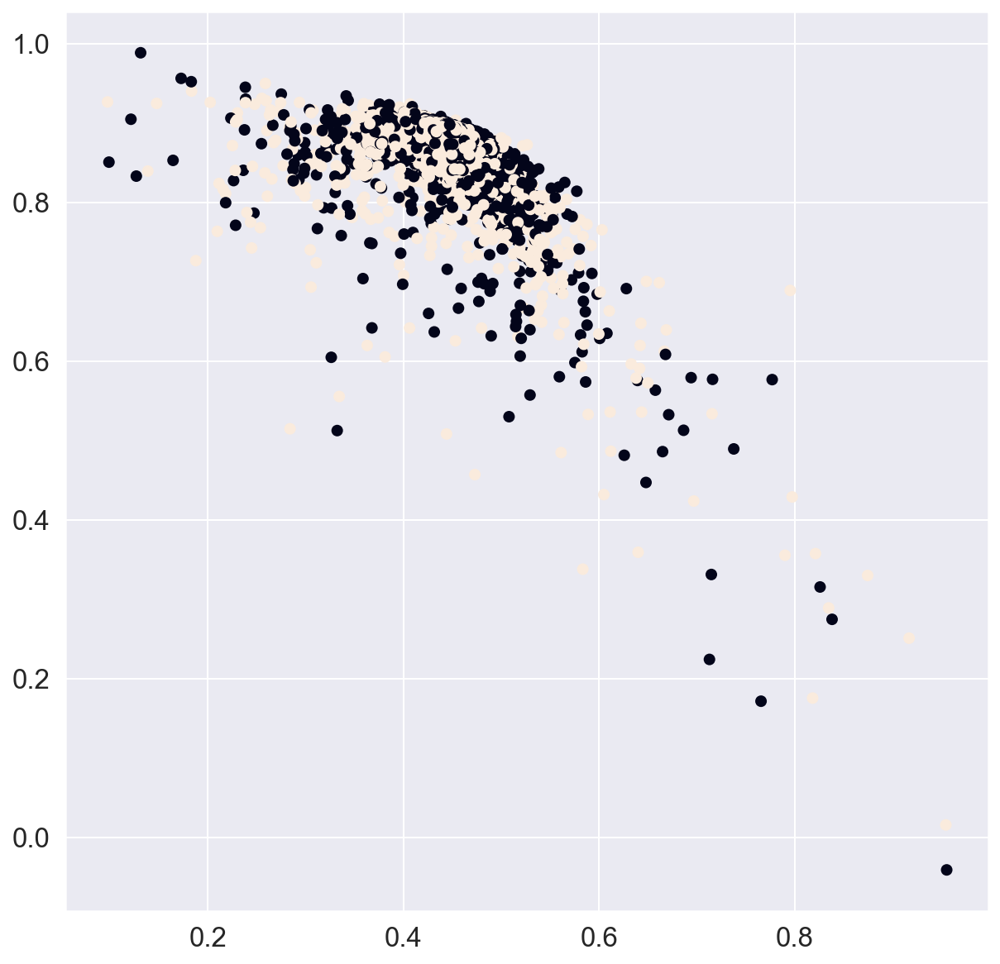

In [151]:
plt.figure(figsize=(10,10))
plt.scatter(Xstd_test1.iloc[:,0],Xstd_test1.iloc[:,6],c=y_test)
plt.show()

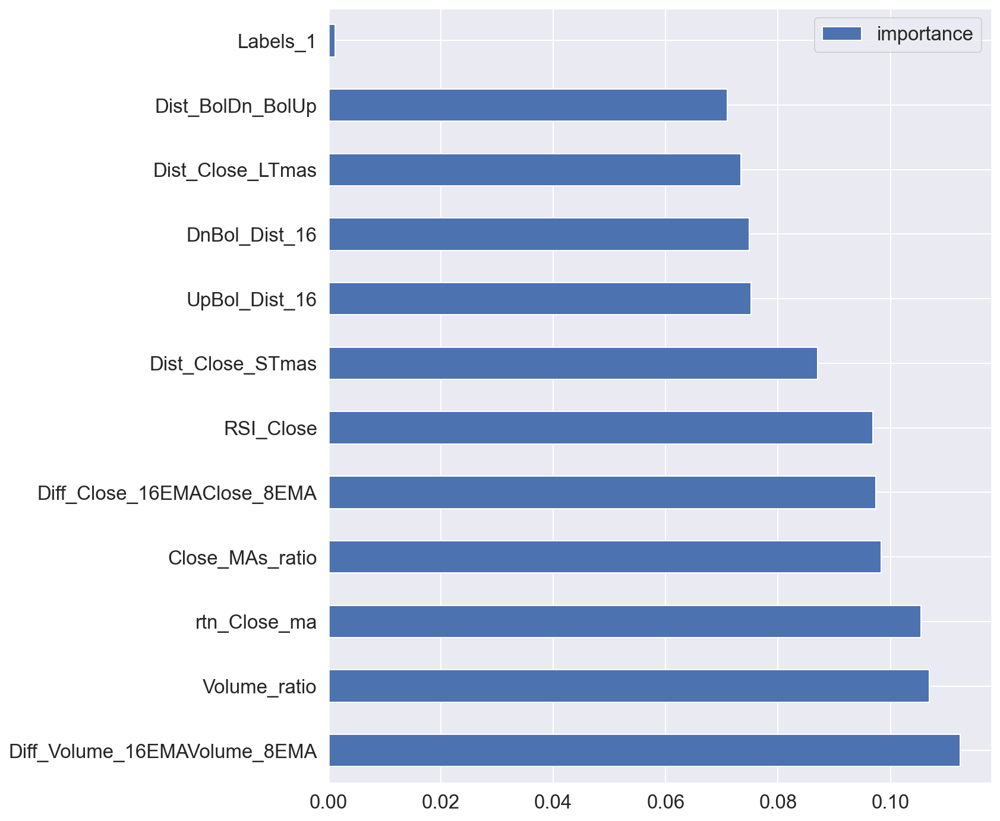

In [119]:
pd.DataFrame(RFC.feature_importances_,
             columns=['importance'],
             index=X2_dum.columns
             ).sort_values(by='importance', ascending=False
                           ).plot(kind='barh', figsize=(10, 12))
plt.show()

In [ ]:
from sklearn.model_selection import GridSearchCV

In [ ]:
params_RFC = {'max_samples': np.linspace(0.3, 1.0, 5),
          'max_features': range(int(1/2.*Xstd_train1.shape[1]), Xstd_train1.shape[1]+1),
           'n_estimators': [100]}

grid_rfc = GridSearchCV(RFC, param_grid=params_RFC, cv=5, n_jobs=-2,verbose=10)
grid_rfc.fit(Xstd_train1, y_train)
grid_rfc.best_params_

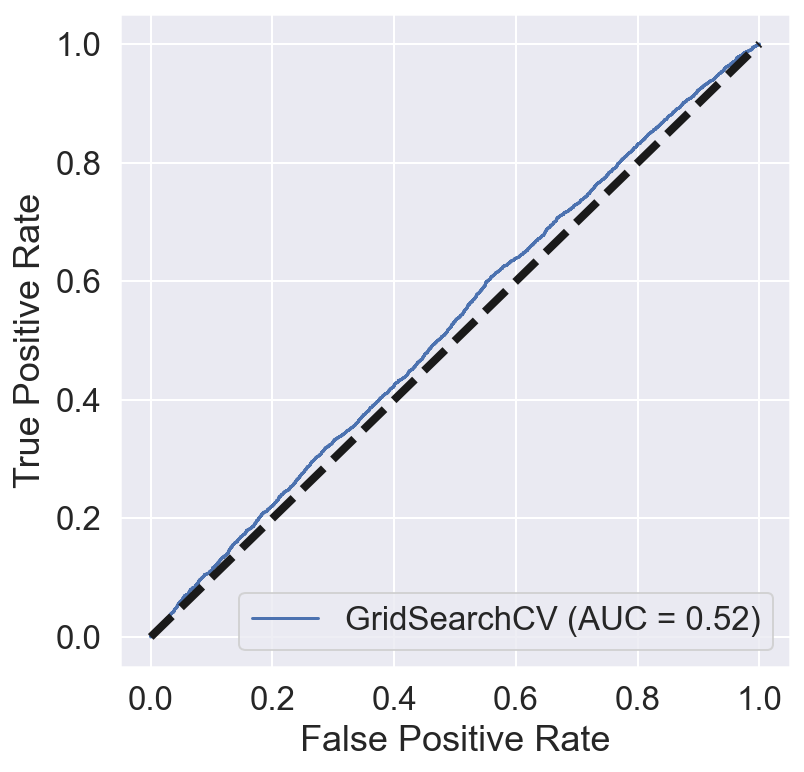

In [125]:
fig, ax = plt.subplots(figsize=(6, 6))
plot_roc_curve(gs_LogReg, Xstd_test1, y_test, ax=ax)
ax.plot([0, 1], [0, 1], 'k--', linewidth=4)
plt.show()

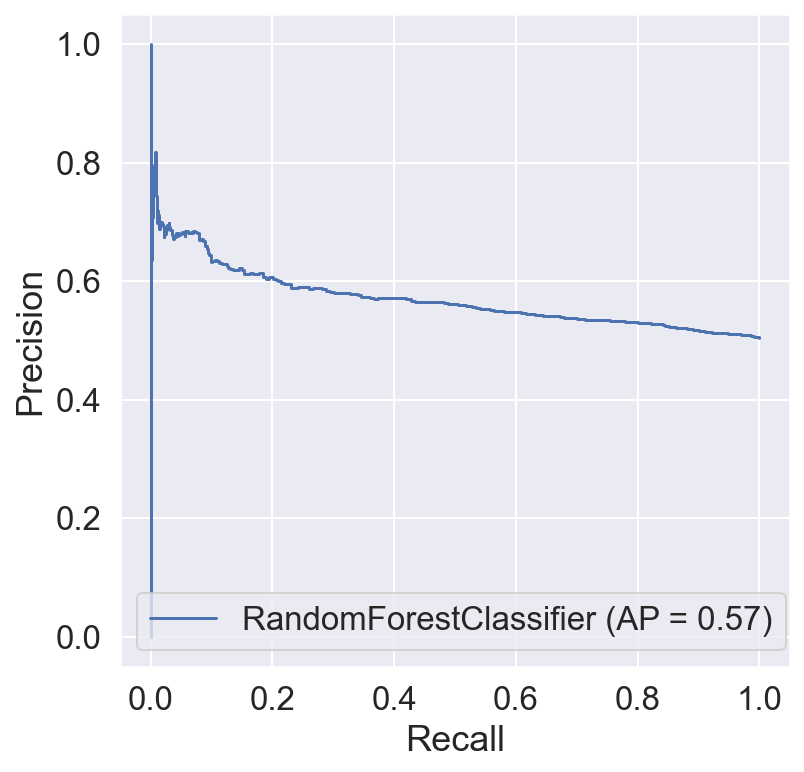

In [121]:
plt.fig, ax = plt.subplots(figsize=(6, 6))
plot_precision_recall_curve(RFC, Xstd_test1, y_test, ax=ax)
plt.show()

In [123]:
from sklearn.metrics import classification_report
print(classification_report(y_test, RFC.predict(Xstd_test1)))

              precision    recall  f1-score   support

          -1       0.55      0.53      0.54      5104
           1       0.55      0.57      0.56      5169

    accuracy                           0.55     10273
   macro avg       0.55      0.55      0.55     10273
weighted avg       0.55      0.55      0.55     10273



In [79]:
from sklearn.metrics import  plot_confusion_matrix, plot_roc_curve, plot_precision_recall_curve, roc_auc_score, average_precision_score

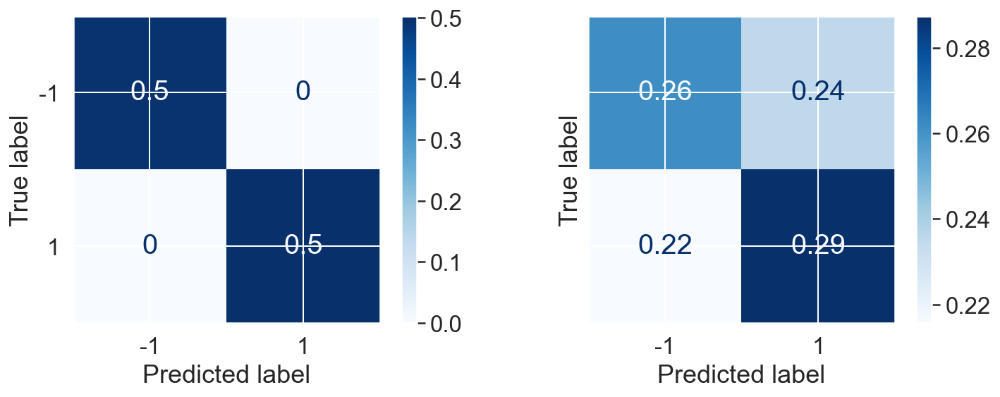

In [80]:
fig, ax = plt.subplots(ncols=2, figsize=(12, 4), sharey=True)
plot_confusion_matrix(RFC, Xstd_train1, y_train, cmap='Blues', ax=ax[0], normalize='all')
plot_confusion_matrix(RFC, Xstd_test1, y_test, cmap='Blues', ax=ax[1], normalize='all')

for a in ax:
    texts = a.texts
    for text in texts:
        text.set_size(20)

plt.show()

In [91]:
from sklearn.ensemble import BaggingClassifier

In [92]:
LogReg = LogisticRegressionCV(solver='saga')

In [83]:
from sklearn.tree import DecisionTreeClassifier
dt = DecisionTreeClassifier()

In [88]:
bagging = BaggingClassifier(base_estimator=dt,
                            max_samples=1.0, 
                            max_features=1.0, 
                            n_estimators=100,
                            verbose =10)

In [89]:
print("Bagging CV training score:\t", 
      cross_val_score(bagging, Xstd_train1, y_train,
                    cv=kf, n_jobs=-2).mean())

bagging.fit(Xstd_train1, y_train)
print("Clf bagging training score:\t", bagging.score(Xstd_train1, y_train))
print("Clf bagging test score:\t", bagging.score(Xstd_test1, y_test))

Bagging CV training score:	 0.5447613774195657
Building estimator 1 of 100 for this parallel run (total 100)...


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


Building estimator 2 of 100 for this parallel run (total 100)...
Building estimator 3 of 100 for this parallel run (total 100)...
Building estimator 4 of 100 for this parallel run (total 100)...
Building estimator 5 of 100 for this parallel run (total 100)...
Building estimator 6 of 100 for this parallel run (total 100)...
Building estimator 7 of 100 for this parallel run (total 100)...
Building estimator 8 of 100 for this parallel run (total 100)...
Building estimator 9 of 100 for this parallel run (total 100)...
Building estimator 10 of 100 for this parallel run (total 100)...
Building estimator 11 of 100 for this parallel run (total 100)...
Building estimator 12 of 100 for this parallel run (total 100)...
Building estimator 13 of 100 for this parallel run (total 100)...
Building estimator 14 of 100 for this parallel run (total 100)...
Building estimator 15 of 100 for this parallel run (total 100)...
Building estimator 16 of 100 for this parallel run (total 100)...
Building estimator

[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:   38.9s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:   38.9s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.8s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.8s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


Clf bagging training score:	 1.0
Clf bagging test score:	 0.5435607904214932


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.2s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.2s finished


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.8s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.8s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.2s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.2s finished


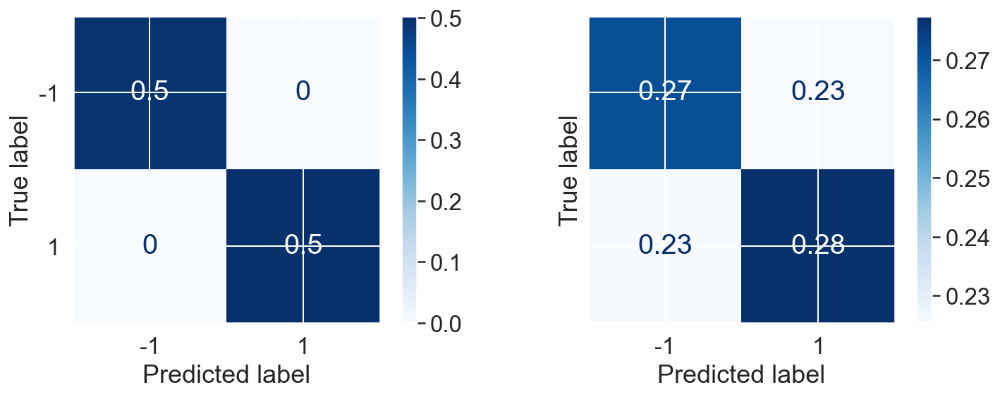

In [86]:
fig, ax = plt.subplots(ncols=2, figsize=(12, 4), sharey=True)
plot_confusion_matrix(bagging, Xstd_train1, y_train, cmap='Blues', ax=ax[0], normalize='all')
plot_confusion_matrix(bagging, Xstd_test1, y_test, cmap='Blues', ax=ax[1], normalize='all')

for a in ax:
    texts = a.texts
    for text in texts:
        text.set_size(20)

plt.show()

In [94]:
from sklearn.model_selection import GridSearchCV

In [ ]:
params = {'max_samples': np.linspace(0.3, 1.0, 5),
          'max_features': range(int(1/2.*Xstd_train1.shape[1]), Xstd_train1.shape[1]+1),
           'n_estimators': [100]}

grid = GridSearchCV(bagging, param_grid=params, cv=5, n_jobs=-2)
grid.fit(Xstd_train1, y_train)
grid.best_estimator_

In [ ]:
grid.best_score_

In [ ]:
fig, ax = plt.subplots(ncols=2, figsize=(12, 4), sharey=True)
plot_confusion_matrix(grid, Xstd_train1, y_train, cmap='Blues', ax=ax[0], normalize='all')
plot_confusion_matrix(grid, Xstd_test1, y_test, cmap='Blues', ax=ax[1], normalize='all')

for a in ax:
    texts = a.texts
    for text in texts:
        text.set_size(20)

plt.show()

In [95]:
params_LogReg = {'Cs' : [np.logspace(-4, 4, 10)],
              'penalty' : ['l2','l1','elasticnet'],
              'max_iter' : [10000],
                 'l1_ratios' : [0.001, 0.01, 0.05, 0.1, 0.5]}
gs_LogReg = GridSearchCV(LogReg,params_LogReg,cv=5,verbose=10)
gs_LogReg.fit(Xstd_train1, y_train)

Fitting 5 folds for each of 15 candidates, totalling 75 fits
[CV] Cs=[1.00000000e-04 7.74263683e-04 5.99484250e-03 4.64158883e-02
 3.59381366e-01 2.78255940e+00 2.15443469e+01 1.66810054e+02
 1.29154967e+03 1.00000000e+04], l1_ratios=0.001, max_iter=10000, penalty=l2 


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV]  Cs=[1.00000000e-04 7.74263683e-04 5.99484250e-03 4.64158883e-02
 3.59381366e-01 2.78255940e+00 2.15443469e+01 1.66810054e+02
 1.29154967e+03 1.00000000e+04], l1_ratios=0.001, max_iter=10000, penalty=l2, score=0.526, total=   8.3s
[CV] Cs=[1.00000000e-04 7.74263683e-04 5.99484250e-03 4.64158883e-02
 3.59381366e-01 2.78255940e+00 2.15443469e+01 1.66810054e+02
 1.29154967e+03 1.00000000e+04], l1_ratios=0.001, max_iter=10000, penalty=l2 


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    8.2s remaining:    0.0s


[CV]  Cs=[1.00000000e-04 7.74263683e-04 5.99484250e-03 4.64158883e-02
 3.59381366e-01 2.78255940e+00 2.15443469e+01 1.66810054e+02
 1.29154967e+03 1.00000000e+04], l1_ratios=0.001, max_iter=10000, penalty=l2, score=0.515, total=   7.4s
[CV] Cs=[1.00000000e-04 7.74263683e-04 5.99484250e-03 4.64158883e-02
 3.59381366e-01 2.78255940e+00 2.15443469e+01 1.66810054e+02
 1.29154967e+03 1.00000000e+04], l1_ratios=0.001, max_iter=10000, penalty=l2 


[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:   15.6s remaining:    0.0s


[CV]  Cs=[1.00000000e-04 7.74263683e-04 5.99484250e-03 4.64158883e-02
 3.59381366e-01 2.78255940e+00 2.15443469e+01 1.66810054e+02
 1.29154967e+03 1.00000000e+04], l1_ratios=0.001, max_iter=10000, penalty=l2, score=0.521, total=   6.7s
[CV] Cs=[1.00000000e-04 7.74263683e-04 5.99484250e-03 4.64158883e-02
 3.59381366e-01 2.78255940e+00 2.15443469e+01 1.66810054e+02
 1.29154967e+03 1.00000000e+04], l1_ratios=0.001, max_iter=10000, penalty=l2 


[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:   22.3s remaining:    0.0s


[CV]  Cs=[1.00000000e-04 7.74263683e-04 5.99484250e-03 4.64158883e-02
 3.59381366e-01 2.78255940e+00 2.15443469e+01 1.66810054e+02
 1.29154967e+03 1.00000000e+04], l1_ratios=0.001, max_iter=10000, penalty=l2, score=0.522, total=   6.3s
[CV] Cs=[1.00000000e-04 7.74263683e-04 5.99484250e-03 4.64158883e-02
 3.59381366e-01 2.78255940e+00 2.15443469e+01 1.66810054e+02
 1.29154967e+03 1.00000000e+04], l1_ratios=0.001, max_iter=10000, penalty=l2 


[Parallel(n_jobs=1)]: Done   4 out of   4 | elapsed:   28.6s remaining:    0.0s


[CV]  Cs=[1.00000000e-04 7.74263683e-04 5.99484250e-03 4.64158883e-02
 3.59381366e-01 2.78255940e+00 2.15443469e+01 1.66810054e+02
 1.29154967e+03 1.00000000e+04], l1_ratios=0.001, max_iter=10000, penalty=l2, score=0.520, total=   7.8s
[CV] Cs=[1.00000000e-04 7.74263683e-04 5.99484250e-03 4.64158883e-02
 3.59381366e-01 2.78255940e+00 2.15443469e+01 1.66810054e+02
 1.29154967e+03 1.00000000e+04], l1_ratios=0.001, max_iter=10000, penalty=l1 


[Parallel(n_jobs=1)]: Done   5 out of   5 | elapsed:   36.3s remaining:    0.0s


[CV]  Cs=[1.00000000e-04 7.74263683e-04 5.99484250e-03 4.64158883e-02
 3.59381366e-01 2.78255940e+00 2.15443469e+01 1.66810054e+02
 1.29154967e+03 1.00000000e+04], l1_ratios=0.001, max_iter=10000, penalty=l1, score=0.526, total=  16.9s
[CV] Cs=[1.00000000e-04 7.74263683e-04 5.99484250e-03 4.64158883e-02
 3.59381366e-01 2.78255940e+00 2.15443469e+01 1.66810054e+02
 1.29154967e+03 1.00000000e+04], l1_ratios=0.001, max_iter=10000, penalty=l1 


[Parallel(n_jobs=1)]: Done   6 out of   6 | elapsed:   53.2s remaining:    0.0s


[CV]  Cs=[1.00000000e-04 7.74263683e-04 5.99484250e-03 4.64158883e-02
 3.59381366e-01 2.78255940e+00 2.15443469e+01 1.66810054e+02
 1.29154967e+03 1.00000000e+04], l1_ratios=0.001, max_iter=10000, penalty=l1, score=0.513, total=  18.9s
[CV] Cs=[1.00000000e-04 7.74263683e-04 5.99484250e-03 4.64158883e-02
 3.59381366e-01 2.78255940e+00 2.15443469e+01 1.66810054e+02
 1.29154967e+03 1.00000000e+04], l1_ratios=0.001, max_iter=10000, penalty=l1 


[Parallel(n_jobs=1)]: Done   7 out of   7 | elapsed:  1.2min remaining:    0.0s


[CV]  Cs=[1.00000000e-04 7.74263683e-04 5.99484250e-03 4.64158883e-02
 3.59381366e-01 2.78255940e+00 2.15443469e+01 1.66810054e+02
 1.29154967e+03 1.00000000e+04], l1_ratios=0.001, max_iter=10000, penalty=l1, score=0.518, total=  15.7s
[CV] Cs=[1.00000000e-04 7.74263683e-04 5.99484250e-03 4.64158883e-02
 3.59381366e-01 2.78255940e+00 2.15443469e+01 1.66810054e+02
 1.29154967e+03 1.00000000e+04], l1_ratios=0.001, max_iter=10000, penalty=l1 


[Parallel(n_jobs=1)]: Done   8 out of   8 | elapsed:  1.5min remaining:    0.0s


[CV]  Cs=[1.00000000e-04 7.74263683e-04 5.99484250e-03 4.64158883e-02
 3.59381366e-01 2.78255940e+00 2.15443469e+01 1.66810054e+02
 1.29154967e+03 1.00000000e+04], l1_ratios=0.001, max_iter=10000, penalty=l1, score=0.520, total=  18.1s
[CV] Cs=[1.00000000e-04 7.74263683e-04 5.99484250e-03 4.64158883e-02
 3.59381366e-01 2.78255940e+00 2.15443469e+01 1.66810054e+02
 1.29154967e+03 1.00000000e+04], l1_ratios=0.001, max_iter=10000, penalty=l1 


[Parallel(n_jobs=1)]: Done   9 out of   9 | elapsed:  1.8min remaining:    0.0s


[CV]  Cs=[1.00000000e-04 7.74263683e-04 5.99484250e-03 4.64158883e-02
 3.59381366e-01 2.78255940e+00 2.15443469e+01 1.66810054e+02
 1.29154967e+03 1.00000000e+04], l1_ratios=0.001, max_iter=10000, penalty=l1, score=0.521, total=  14.8s
[CV] Cs=[1.00000000e-04 7.74263683e-04 5.99484250e-03 4.64158883e-02
 3.59381366e-01 2.78255940e+00 2.15443469e+01 1.66810054e+02
 1.29154967e+03 1.00000000e+04], l1_ratios=0.001, max_iter=10000, penalty=elasticnet 
[CV]  Cs=[1.00000000e-04 7.74263683e-04 5.99484250e-03 4.64158883e-02
 3.59381366e-01 2.78255940e+00 2.15443469e+01 1.66810054e+02
 1.29154967e+03 1.00000000e+04], l1_ratios=0.001, max_iter=10000, penalty=elasticnet, score=nan, total=   0.0s
[CV] Cs=[1.00000000e-04 7.74263683e-04 5.99484250e-03 4.64158883e-02
 3.59381366e-01 2.78255940e+00 2.15443469e+01 1.66810054e+02
 1.29154967e+03 1.00000000e+04], l1_ratios=0.001, max_iter=10000, penalty=elasticnet 
[CV]  Cs=[1.00000000e-04 7.74263683e-04 5.99484250e-03 4.64158883e-02
 3.59381366e-01 2.78

[CV]  Cs=[1.00000000e-04 7.74263683e-04 5.99484250e-03 4.64158883e-02
 3.59381366e-01 2.78255940e+00 2.15443469e+01 1.66810054e+02
 1.29154967e+03 1.00000000e+04], l1_ratios=0.05, max_iter=10000, penalty=l2, score=0.526, total=   8.5s
[CV] Cs=[1.00000000e-04 7.74263683e-04 5.99484250e-03 4.64158883e-02
 3.59381366e-01 2.78255940e+00 2.15443469e+01 1.66810054e+02
 1.29154967e+03 1.00000000e+04], l1_ratios=0.05, max_iter=10000, penalty=l2 
[CV]  Cs=[1.00000000e-04 7.74263683e-04 5.99484250e-03 4.64158883e-02
 3.59381366e-01 2.78255940e+00 2.15443469e+01 1.66810054e+02
 1.29154967e+03 1.00000000e+04], l1_ratios=0.05, max_iter=10000, penalty=l2, score=0.515, total=   7.4s
[CV] Cs=[1.00000000e-04 7.74263683e-04 5.99484250e-03 4.64158883e-02
 3.59381366e-01 2.78255940e+00 2.15443469e+01 1.66810054e+02
 1.29154967e+03 1.00000000e+04], l1_ratios=0.05, max_iter=10000, penalty=l2 
[CV]  Cs=[1.00000000e-04 7.74263683e-04 5.99484250e-03 4.64158883e-02
 3.59381366e-01 2.78255940e+00 2.15443469e+01 

[CV]  Cs=[1.00000000e-04 7.74263683e-04 5.99484250e-03 4.64158883e-02
 3.59381366e-01 2.78255940e+00 2.15443469e+01 1.66810054e+02
 1.29154967e+03 1.00000000e+04], l1_ratios=0.1, max_iter=10000, penalty=l2, score=0.520, total=   7.1s
[CV] Cs=[1.00000000e-04 7.74263683e-04 5.99484250e-03 4.64158883e-02
 3.59381366e-01 2.78255940e+00 2.15443469e+01 1.66810054e+02
 1.29154967e+03 1.00000000e+04], l1_ratios=0.1, max_iter=10000, penalty=l1 
[CV]  Cs=[1.00000000e-04 7.74263683e-04 5.99484250e-03 4.64158883e-02
 3.59381366e-01 2.78255940e+00 2.15443469e+01 1.66810054e+02
 1.29154967e+03 1.00000000e+04], l1_ratios=0.1, max_iter=10000, penalty=l1, score=0.526, total=  17.0s
[CV] Cs=[1.00000000e-04 7.74263683e-04 5.99484250e-03 4.64158883e-02
 3.59381366e-01 2.78255940e+00 2.15443469e+01 1.66810054e+02
 1.29154967e+03 1.00000000e+04], l1_ratios=0.1, max_iter=10000, penalty=l1 
[CV]  Cs=[1.00000000e-04 7.74263683e-04 5.99484250e-03 4.64158883e-02
 3.59381366e-01 2.78255940e+00 2.15443469e+01 1.66

[CV]  Cs=[1.00000000e-04 7.74263683e-04 5.99484250e-03 4.64158883e-02
 3.59381366e-01 2.78255940e+00 2.15443469e+01 1.66810054e+02
 1.29154967e+03 1.00000000e+04], l1_ratios=0.5, max_iter=10000, penalty=l1, score=0.520, total=  17.8s
[CV] Cs=[1.00000000e-04 7.74263683e-04 5.99484250e-03 4.64158883e-02
 3.59381366e-01 2.78255940e+00 2.15443469e+01 1.66810054e+02
 1.29154967e+03 1.00000000e+04], l1_ratios=0.5, max_iter=10000, penalty=l1 
[CV]  Cs=[1.00000000e-04 7.74263683e-04 5.99484250e-03 4.64158883e-02
 3.59381366e-01 2.78255940e+00 2.15443469e+01 1.66810054e+02
 1.29154967e+03 1.00000000e+04], l1_ratios=0.5, max_iter=10000, penalty=l1, score=0.521, total=  15.0s
[CV] Cs=[1.00000000e-04 7.74263683e-04 5.99484250e-03 4.64158883e-02
 3.59381366e-01 2.78255940e+00 2.15443469e+01 1.66810054e+02
 1.29154967e+03 1.00000000e+04], l1_ratios=0.5, max_iter=10000, penalty=elasticnet 
[CV]  Cs=[1.00000000e-04 7.74263683e-04 5.99484250e-03 4.64158883e-02
 3.59381366e-01 2.78255940e+00 2.15443469e

[Parallel(n_jobs=1)]: Done  75 out of  75 | elapsed: 10.0min finished


GridSearchCV(cv=5, estimator=LogisticRegressionCV(solver='saga'),
             param_grid={'Cs': [array([1.00000000e-04, 7.74263683e-04, 5.99484250e-03, 4.64158883e-02,
       3.59381366e-01, 2.78255940e+00, 2.15443469e+01, 1.66810054e+02,
       1.29154967e+03, 1.00000000e+04])],
                         'l1_ratios': [0.001, 0.01, 0.05, 0.1, 0.5],
                         'max_iter': [10000],
                         'penalty': ['l2', 'l1', 'elasticnet']},
             verbose=10)

In [96]:
gs_LogReg.best_params_

{'Cs': array([1.00000000e-04, 7.74263683e-04, 5.99484250e-03, 4.64158883e-02,
        3.59381366e-01, 2.78255940e+00, 2.15443469e+01, 1.66810054e+02,
        1.29154967e+03, 1.00000000e+04]),
 'l1_ratios': 0.05,
 'max_iter': 10000,
 'penalty': 'l2'}

In [97]:
gs_LogReg.best_score_

0.5210421921953067

In [100]:
gs_LogReg.score(Xstd_test1,y_test)

0.5201012362503651

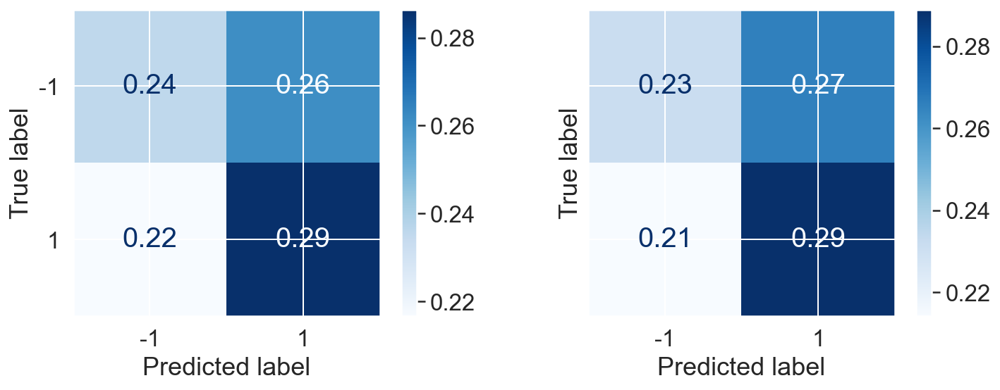

In [113]:
fig, ax = plt.subplots(ncols=2, figsize=(12, 4), sharey=True)
plot_confusion_matrix(gs_LogReg, Xstd_train1, y_train, cmap='Blues', ax=ax[0], normalize='all')
plot_confusion_matrix(gs_LogReg, Xstd_test1, y_test, cmap='Blues', ax=ax[1], normalize='all')

for a in ax:
    texts = a.texts
    for text in texts:
        text.set_size(20)

plt.show()

In [101]:
from sklearn.svm import SVC, LinearSVC

In [102]:
SVC1 = LinearSVC(loss='hinge', max_iter=5000, class_weight='balanced')
SVC2 = SVC(kernel='poly', gamma='scale', class_weight='balanced')

In [103]:
params_svm = {'C': np.logspace(-2, 2, 5),
              'gamma': np.linspace(0.01, 2, 5),
              'kernel': ['poly','linear','rbf']}
params_svm_poly = {'C': np.logspace(-2, 2, 5),
              'gamma': np.linspace(0.01, 2, 5),
              'kernel': ['poly'],
            'degree' : [2,3,4]}

In [104]:
print(cross_val_score(SVC1, Xstd_train1, y_train, cv=5, scoring='accuracy').mean())
print(cross_val_score(SVC2, Xstd_train1, y_train, cv=5, scoring='accuracy').mean())

0.5145850564319967
0.5185437724007214


In [105]:
SVC1.fit(Xstd_train1, y_train)
SVC2.fit(Xstd_train1, y_train)

SVC(class_weight='balanced', kernel='poly')

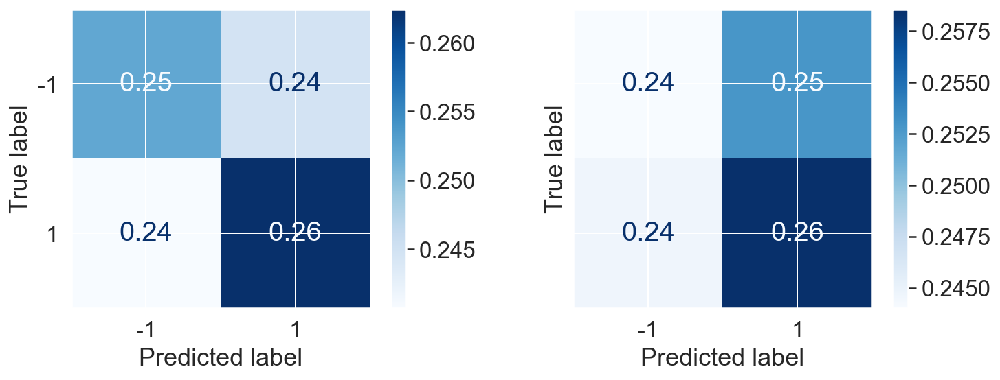

In [106]:
fig, ax = plt.subplots(ncols=2, figsize=(12, 4), sharey=True)
plot_confusion_matrix(SVC1, Xstd_train1, y_train, cmap='Blues', ax=ax[0], normalize='all')
plot_confusion_matrix(SVC1, Xstd_test1, y_test, cmap='Blues', ax=ax[1], normalize='all')

for a in ax:
    texts = a.texts
    for text in texts:
        text.set_size(20)

plt.show()

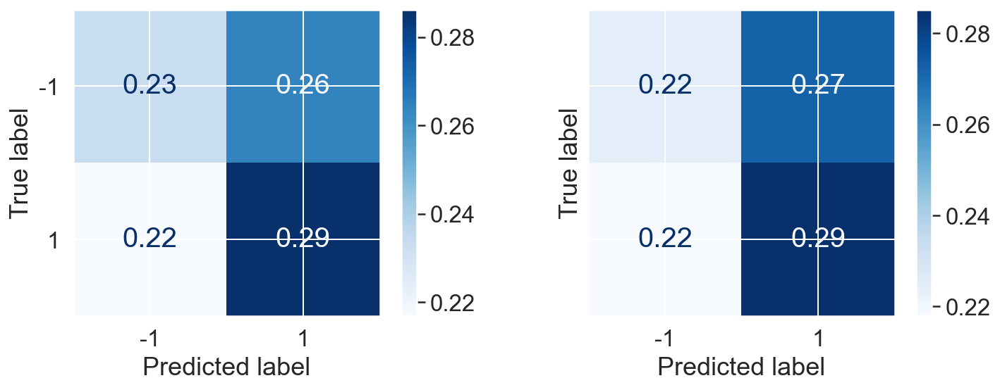

In [107]:
fig, ax = plt.subplots(ncols=2, figsize=(12, 4), sharey=True)
plot_confusion_matrix(SVC2, Xstd_train1, y_train, cmap='Blues', ax=ax[0], normalize='all')
plot_confusion_matrix(SVC2, Xstd_test1, y_test, cmap='Blues', ax=ax[1], normalize='all')

for a in ax:
    texts = a.texts
    for text in texts:
        text.set_size(20)

plt.show()

In [108]:
SVC3 = SVC()
gridsvm = GridSearchCV(SVC3, param_grid=params_svm, cv=5, n_jobs=-2,verbose=10)
gridsvm.fit(Xstd_train1, y_train)
gridsvm.best_estimator_

Fitting 5 folds for each of 75 candidates, totalling 375 fits


[Parallel(n_jobs=-2)]: Using backend LokyBackend with 7 concurrent workers.
[Parallel(n_jobs=-2)]: Done   4 tasks      | elapsed:   48.8s
[Parallel(n_jobs=-2)]: Done  11 tasks      | elapsed:  1.7min
[Parallel(n_jobs=-2)]: Done  18 tasks      | elapsed:  2.4min
[Parallel(n_jobs=-2)]: Done  27 tasks      | elapsed:  3.5min
[Parallel(n_jobs=-2)]: Done  36 tasks      | elapsed:  4.5min
[Parallel(n_jobs=-2)]: Done  47 tasks      | elapsed:  5.7min
[Parallel(n_jobs=-2)]: Done  58 tasks      | elapsed:  7.1min
[Parallel(n_jobs=-2)]: Done  71 tasks      | elapsed:  8.7min
[Parallel(n_jobs=-2)]: Done  84 tasks      | elapsed:  9.8min
[Parallel(n_jobs=-2)]: Done  99 tasks      | elapsed: 11.4min
[Parallel(n_jobs=-2)]: Done 114 tasks      | elapsed: 13.3min
[Parallel(n_jobs=-2)]: Done 131 tasks      | elapsed: 15.5min
[Parallel(n_jobs=-2)]: Done 148 tasks      | elapsed: 17.2min
[Parallel(n_jobs=-2)]: Done 167 tasks      | elapsed: 19.4min
[Parallel(n_jobs=-2)]: Done 186 tasks      | elapsed: 21

SVC(C=100.0, gamma=2.0)

In [109]:
gridsvm.best_score_

0.5278561074373317

In [111]:
gridsvm.score(Xstd_test1,y_test)

0.5239949381874818

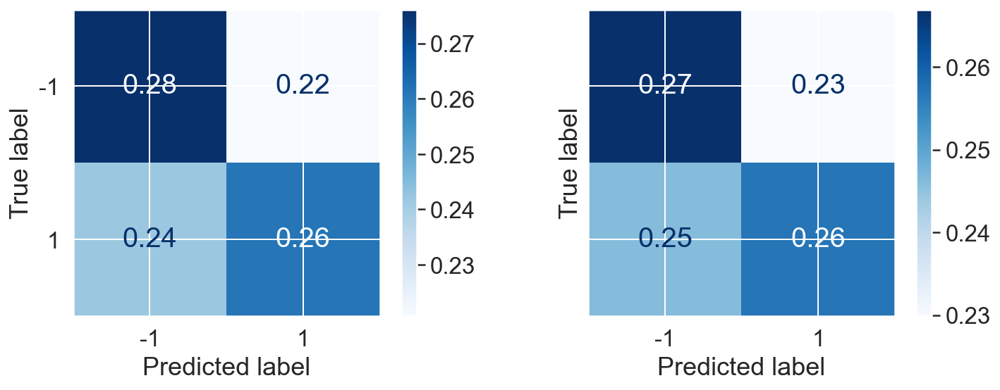

In [112]:
fig, ax = plt.subplots(ncols=2, figsize=(12, 4), sharey=True)
plot_confusion_matrix(gridsvm, Xstd_train1, y_train, cmap='Blues', ax=ax[0], normalize='all')
plot_confusion_matrix(gridsvm, Xstd_test1, y_test, cmap='Blues', ax=ax[1], normalize='all')

for a in ax:
    texts = a.texts
    for text in texts:
        text.set_size(20)

plt.show()

In [ ]:
SVC4 = SVC(kernel='poly')
gridsvm1 = GridSearchCV(SVC4, param_grid=params_svm_poly, cv=5, n_jobs=-2,verbose=10)
gridsvm1.fit(Xstd_train1, y_train)
gridsvm1.best_estimator_

In [ ]:
gridsvm1.best_params_

In [ ]:
gridsvm1.best_score_